In [1]:
import pandas as pd    
import TFvelo as TFv
import anndata as ad
import numpy as np
import scanpy as sc
import scvelo as scv
import matplotlib
#matplotlib.use('AGG')
import os, sys
import scipy
np.set_printoptions(suppress=True)


In [2]:
result_path = 'TFvelo_pancreas_demo2/'
n_jobs = 28
adata = ad.read_h5ad(result_path + 'pp.h5ad')

TFv.tl.recover_dynamics(adata, n_jobs=n_jobs, max_iter=20, var_names='all',
        WX_method='lsq_linear', WX_thres=20, max_n_TF=99, n_top_genes=2000,
        fit_scaling=True, use_raw=0, init_weight_method="correlation", 
        n_time_points=1000) 

adata.write(result_path + 'rc.h5ad')

recovering dynamics (using 28/56 cores)
or disable the progress bar using `show_progress_bar=False`.
Processing 0/72 GSTT1
Processing 0/72 PHLDA1
Processing 0/72 MAFF
Processing 0/72 TECPR2
Processing 0/72 KCNB2
Processing 0/72 GALK1
Processing 0/72 PRR7
Processing 0/72 RAB37
Processing 0/71 TTC30B
GM13111 not recoverable due to n_TFs = 0
TMIGD3 not recoverable due to n_TFs = 0
Processing 0/72 PCP4
Processing 0/72 RCAN2
Processing 0/72 NCOA2
Processing 0/71 PSAT1
Processing 1/71 STEAP1
Processing 0/71 SLC7A14
Processing 0/71 PDX1
Processing 0/72 LPAR6
Processing 0/71 KLHL7
Processing 0/71 G6PC2
Processing 1/71 PSRC1
Processing 0/71 CHN2
Processing 0/71 CES1D
Processing 0/71 RPL13
Processing 0/71 IGSF21
Processing 0/71 SNRPN
Processing 0/71 TSHZ3
0/71 TSHZ3 FINISHED with n_TFs: 13
Processing 1/71 1600014C10RIK
0/72 KCNB2 FINISHED with n_TFs: 13
Processing 1/72 GDAP1
0/72 MAFF FINISHED with n_TFs: 19
Processing 1/72 MGAT3
0/71 SNRPN FINISHED with n_TFs: 9
RP23-54G8.4 not recoverable due 

In [3]:

losses = adata.varm['loss'].copy()
losses[np.isnan(losses)] = 1e6
adata.var['min_loss'] = losses.min(1)

n_cells = adata.shape[0]
expanded_scaling_y = np.expand_dims(np.array(adata.var['fit_scaling_y']),0).repeat(n_cells,axis=0)
adata.layers['velocity'] = adata.layers['velo_hat'] / expanded_scaling_y  

computing velocity graph (using 1/56 cores)
    finished (0:00:23) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


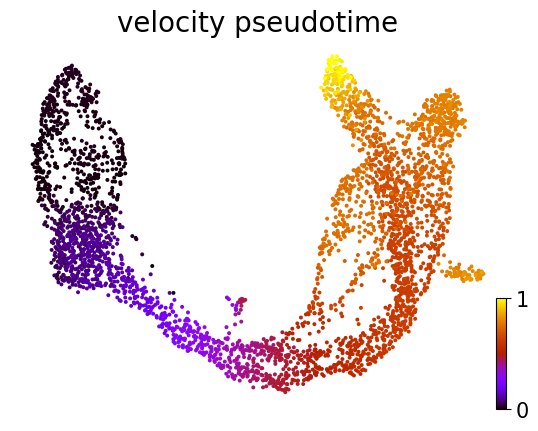

In [4]:

def get_pseudotime(adata):
    TFv.tl.velocity_graph(adata, basis=None, vkey='velocity', xkey='M_total')
    TFv.tl.velocity_pseudotime(adata, vkey='velocity', modality='M_total') 
    TFv.pl.scatter(adata, basis='umap', color='velocity_pseudotime', cmap='gnuplot', fontsize=20)#, save='pseudotime')
    return adata

adata = get_pseudotime(adata)


In [5]:
def data_type_tostr(adata, key=None):
    if key is None:
        for key in list(adata.var):
            if adata.var[key][0] in [True, False]:
                print('Transfering', key)
                adata.var[key] = adata.var[key].map({True: 'True', False:'False'})
    elif key in adata.var.keys():
        if adata.var[key][0] in [True, False]:
            print('Transfering', key)
            adata.var[key] = adata.var[key].map({True: 'True', False:'False'})
    return   

def get_sort_positions(arr):
    positions = np.argsort(np.argsort(arr))
    positions_normed = positions/(len(arr)-1)
    return positions_normed


def get_sort_t(adata):
    t = adata.layers['fit_t_raw'].copy()
    normed_t = adata.layers['fit_t_raw'].copy()
    n_bins = 20
    n_cells, n_genes = adata.shape
    sort_t = np.zeros([n_cells, n_genes])
    non_blank_gene = np.zeros(n_genes, dtype=int)
    hist_all, bins_all = np.zeros([n_genes, n_bins]), np.zeros([n_genes, n_bins+1])
    for i in range(n_genes):
        gene_name = adata.var_names[i]
        tmp = t[:,i].copy()
        if np.isnan(tmp).sum():
            non_blank_gene[i] = 1 
            continue
        hist, bins = np.histogram(tmp, bins=n_bins)
        hist_all[i], bins_all[i] = hist, bins
        if not (0 in list(hist)):
            if (tmp.min() < 0.1) and (tmp.max() > 0.8):
                blank_start_bin_id = np.argmin(hist)
                blank_end_bin_id = blank_start_bin_id
                non_blank_gene[i] = 1
                blank_start_bin = bins[blank_start_bin_id]
                blank_end_bin = bins[blank_end_bin_id]
                tmp = (tmp < blank_start_bin)*1 + tmp 
            else:
                blank_end_bin = tmp.min()
        else:
            blank_start_bin_id = list(hist).index(0)
            for j in range(blank_start_bin_id+1, len(hist)):
                if hist[j] > 0:
                    blank_end_bin_id = j
                    break
            blank_start_bin = bins[blank_start_bin_id]
            blank_end_bin = bins[blank_end_bin_id]
            tmp = (tmp < blank_start_bin)*1 + tmp 
            
        t[:,i] = tmp
        tmp = tmp - blank_end_bin
        tmp = tmp/tmp.max()
        normed_t[:,i] = tmp
        sort_t[:,i] = get_sort_positions(tmp)

    adata.layers['latent_t'] = sort_t.copy() 
    adata.var['non_blank_gene'] = non_blank_gene.copy()
    return adata



adata_copy = adata.copy()
adata_copy = get_sort_t(adata_copy) 

adata_copy_1 = adata_copy.copy()
data_type_tostr(adata_copy_1)
print(adata_copy_1)
adata_copy_1.write(result_path + 'rc.h5ad')

Transfering highly_variable
Transfering non_blank_gene
AnnData object with n_obs × n_vars = 3696 × 2000
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size_total', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'highly_variable_genes', 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_TFs', 'fit_alpha', 'fit_beta', 'fit_omega', 'fit_theta', 'fit_gamma', 'fit_delta', 'fit_likelihood', 'fit_varx', 'fit_scaling_y', 'min_loss', 'non_blank_gene'
    uns: 'all_TFs', 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'genes_all', 'genes_pp', 'neighbors', 'pca', 'recover_dynamics', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'vpt_root', 'vpt_end'
    obsm: 'X_pca', 'X_umap'
    varm: 'TFs', 'TFs_correlation', 'TFs_id', 'TFs_times', 'knockTF_Log2FC', 'fit_scaling', 'fit_weig

In [20]:
def check_data_type(adata):
    for key in list(adata.var):
        if adata.var[key][0] in ['True', 'False']:
            print('Checking', key)
            adata.var[key] = adata.var[key].map({'True': True, 'False': False})
    return

adata_copy = ad.read_h5ad(result_path + 'rc.h5ad')
check_data_type(adata_copy)

Checking highly_variable_genes
Checking highly_variable
Checking non_blank_gene


In [21]:
def get_metric_pseudotime(adata, t_key='latent_t'):
    n_cells, n_genes = adata.shape
    adata.var['spearmanr_pseudotime'] = 0.0
    for i in range(n_genes):
        correlation, _ = scipy.stats.spearmanr(adata.layers[t_key][:,i], adata.obs['velocity_pseudotime'])
        adata.var['spearmanr_pseudotime'][i] = correlation
    return adata

loss_percent_thres = 50
spearmanr_thres = 0.8

thres_loss = np.percentile(adata_copy.var['min_loss'], loss_percent_thres) 
adata_copy = adata_copy[:, adata_copy.var['min_loss'] < thres_loss]

thres_n_cells = adata_copy.X.shape[0] * 0.1
adata_copy = adata_copy[:, adata_copy.var['n_cells'] > thres_n_cells]

adata_copy = adata_copy[:, adata_copy.var['non_blank_gene']==0] 


adata_copy = get_metric_pseudotime(adata_copy)
adata_copy = adata_copy[:, adata_copy.var['spearmanr_pseudotime'] > spearmanr_thres] 

computing velocity graph (using 1/56 cores)
    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


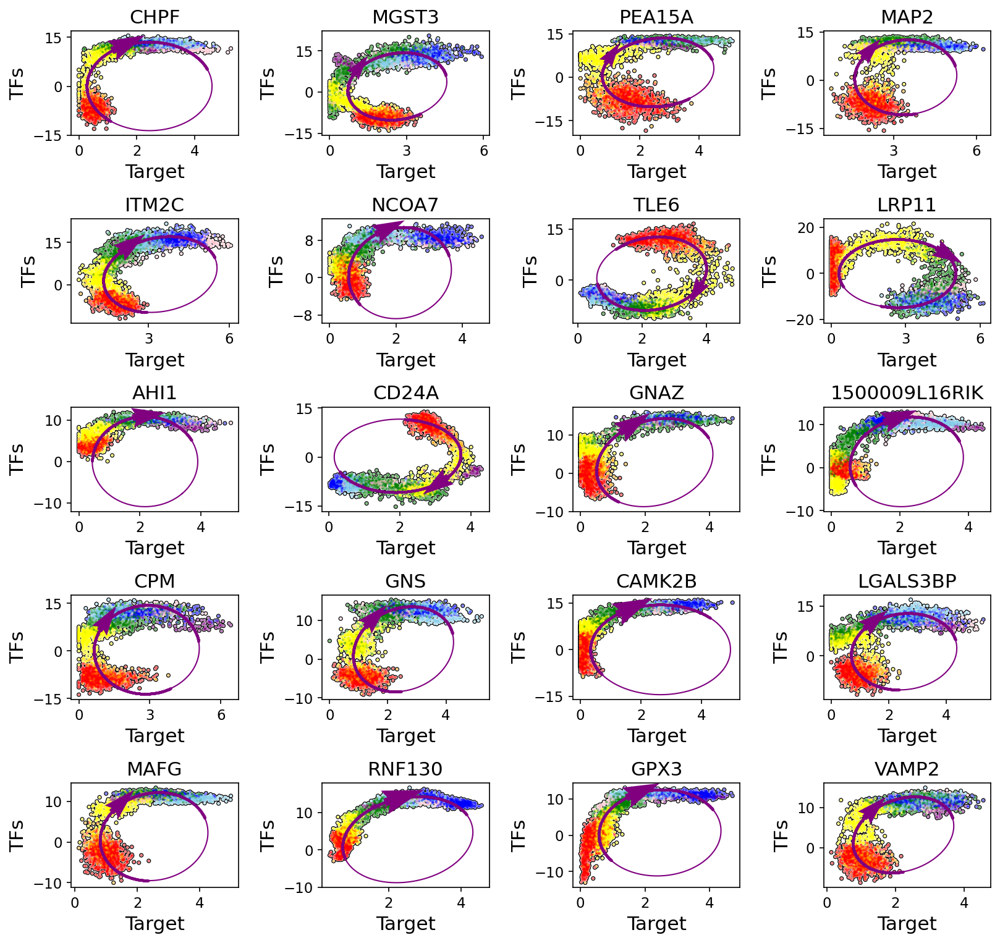

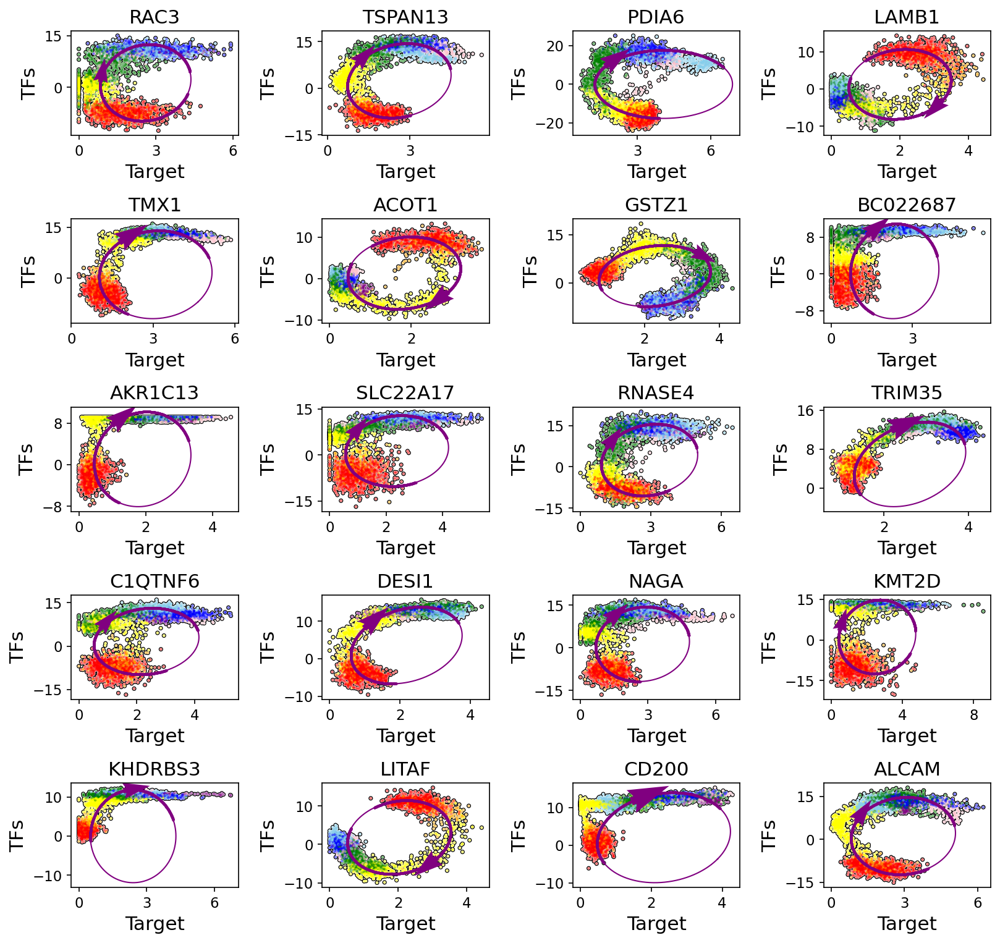

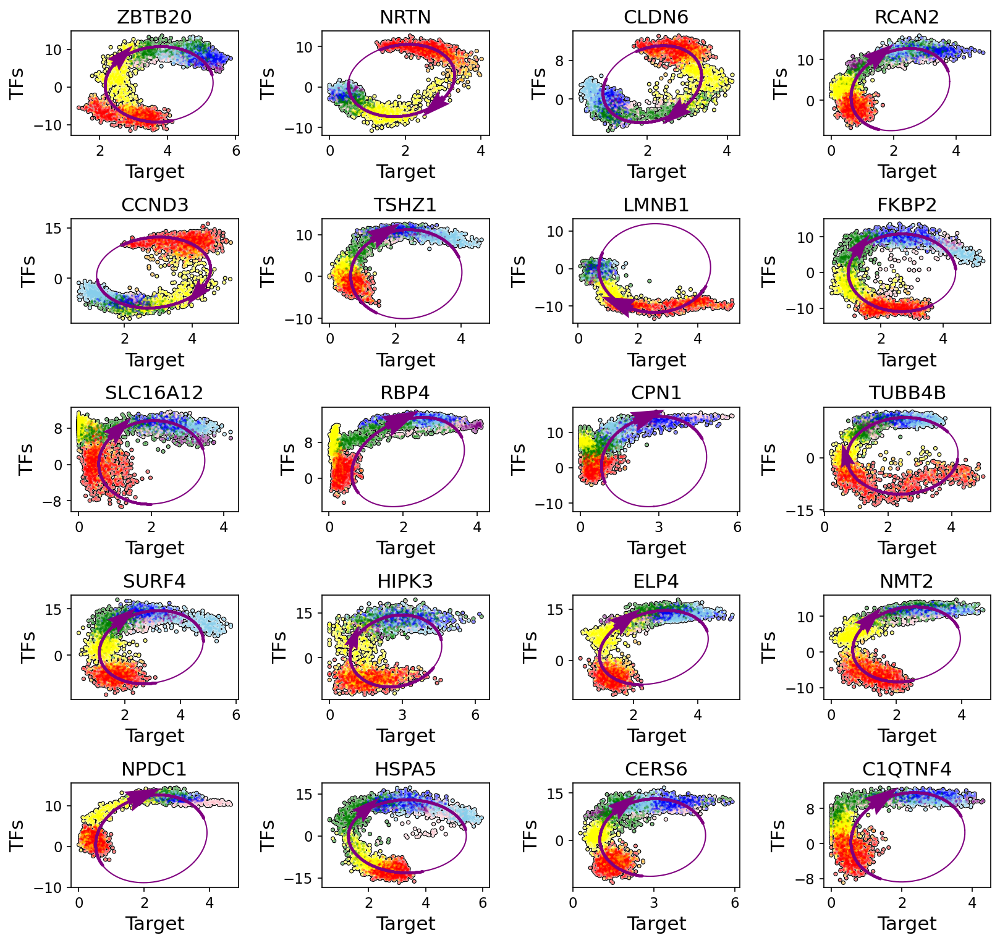

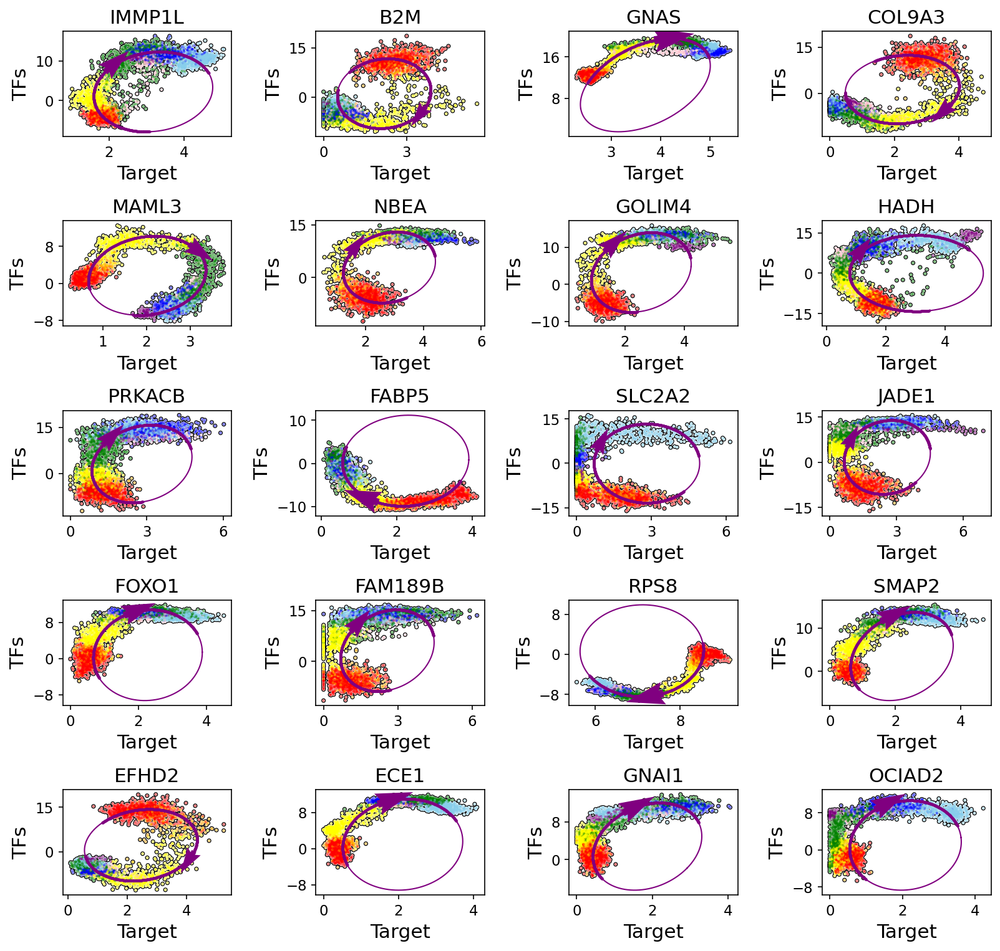

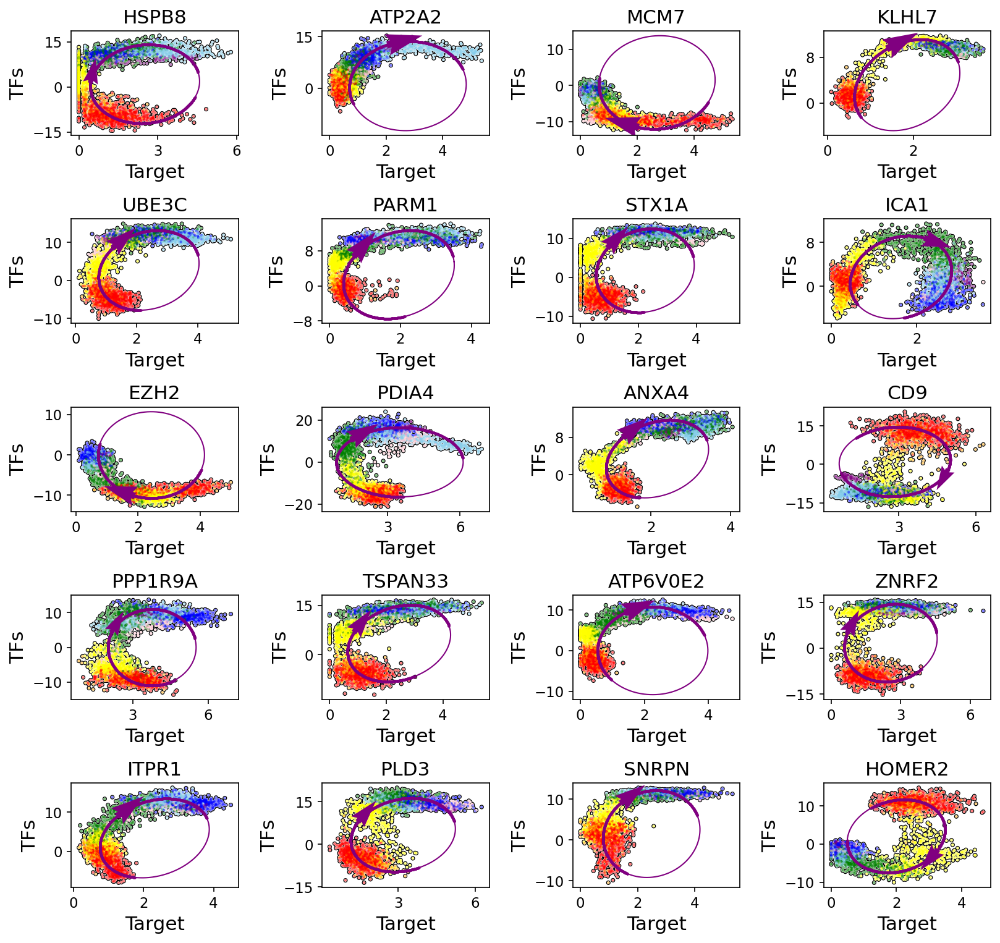

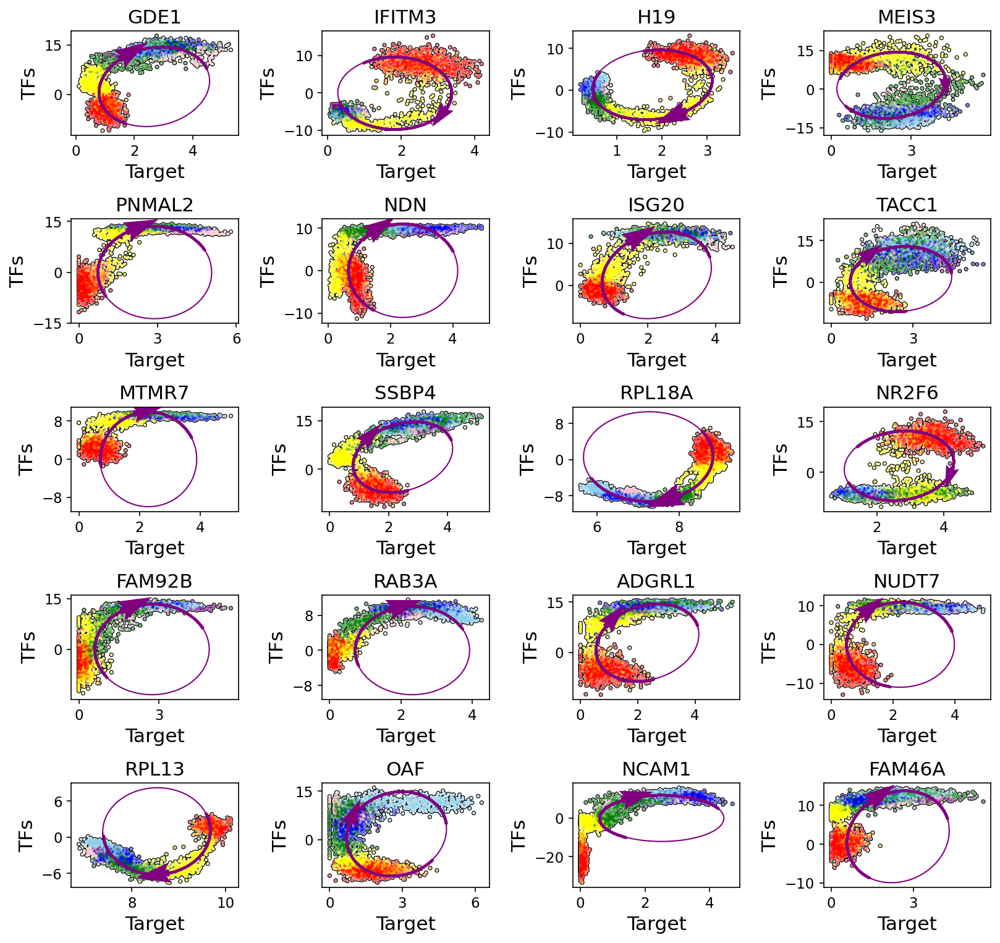

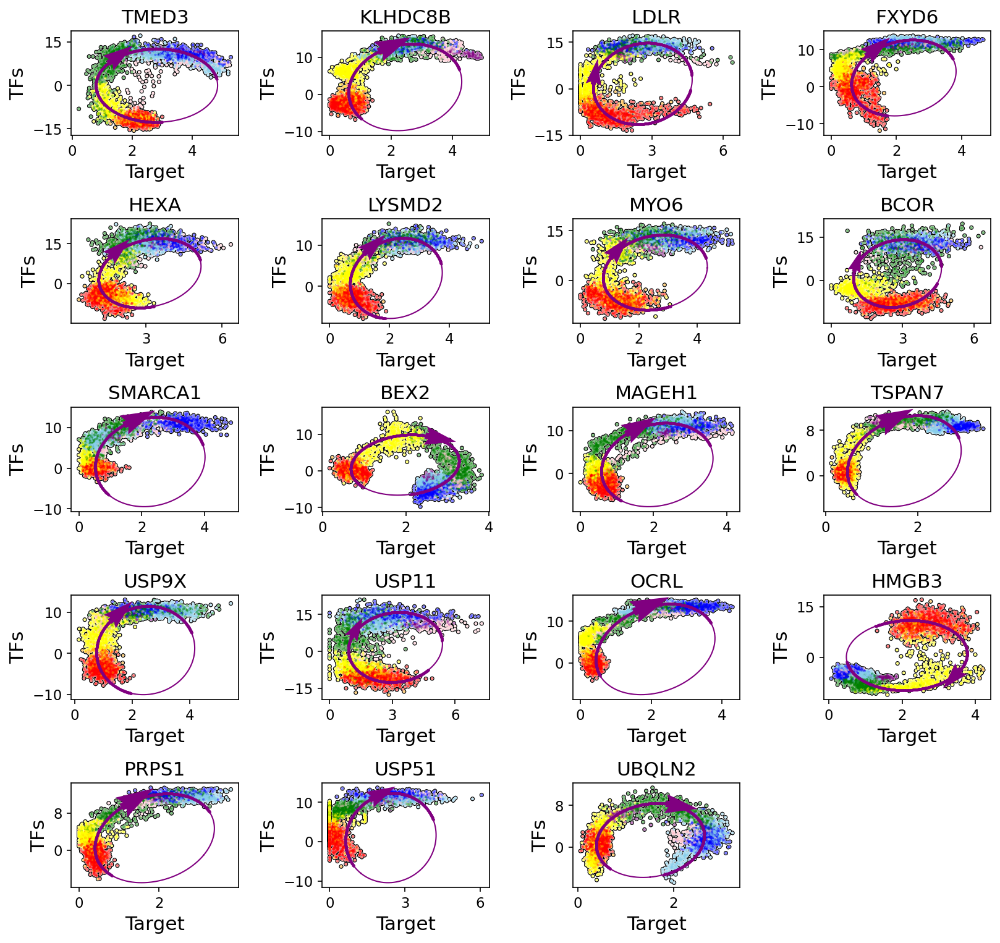

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


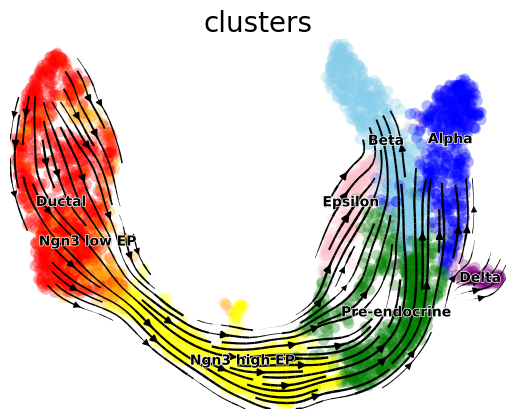

Transfering highly_variable_genes
Transfering highly_variable
Transfering non_blank_gene
AnnData object with n_obs × n_vars = 3696 × 139
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size_total', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'highly_variable_genes', 'n_cells', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_TFs', 'fit_alpha', 'fit_beta', 'fit_omega', 'fit_theta', 'fit_gamma', 'fit_delta', 'fit_likelihood', 'fit_varx', 'fit_scaling_y', 'min_loss', 'non_blank_gene', 'spearmanr_pseudotime'
    uns: 'all_TFs', 'clusters_coarse_colors', 'day_colors', 'genes_all', 'genes_pp', 'neighbors', 'pca', 'recover_dynamics', 'velocity_graph', 'velocity_graph_neg', 'velocity_params', 'vpt_end', 'vpt_root', 'clusters_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'TFs', 'TFs_corre

In [22]:

def show_adata(adata, save_name, show_all=0):
    if show_all:
        for i in range(int((len(adata.var_names)-1)/20)+1):
            genes2show = adata.var_names[i*20: (i+1)*20]
            TFv.pl.velocity(adata, genes2show, ncols=4, add_outline=True, layers='na', dpi=150, fontsize=15)#, save='WX_y_'+save_name+'_'+str(i)) #layers='all'
    if len(adata.obs['clusters'].cat.categories) > 10:
        legend_loc = 'right margin'
    else:
        legend_loc = 'on data'
    cutoff_perc = 20
    TFv.pl.velocity_embedding_stream(adata, vkey='velocity', use_derivative=False, density=2, basis='umap', \
        cutoff_perc=cutoff_perc, smooth=0.5, fontsize=20, recompute=True, \
        legend_loc=legend_loc)#, save='embedding_stream_'+save_name) # 

    return

TFv.tl.velocity_graph(adata_copy, basis=None, vkey='velocity', xkey='M_total')
adata_copy.uns['clusters_colors'] = adata.uns['clusters_colors']
show_adata(adata_copy, save_name='velo', show_all=1)


data_type_tostr(adata_copy)
print(adata_copy)
adata_copy.write(result_path + 'TFvelo.h5ad')